# PA005: High Values Customer Identification (Insiders)

# Imports

In [1]:
import re
import numpy as np
import pandas as pd
import seaborn as sns
import umap.umap_ as umap

import matplotlib.pyplot as plt
from IPython.display import HTML

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# Helper Functions

## 0.0 Planejamento da Solução  (IOT)

### Input - Entrada

1. Problema de Negócio
  - Selecionar os clientes mais valiosos para integrar um programa de Fidelização
  

2. Conjunto de dados
  - Vendas de um  e-commerce online, durante o período de uma ano

### Output - Saída

1. A indicação das pessoas que farão parte do programa Insiders.
  - Lista cliente_id | is_insider|
  
    
2. Relátorio com as respostas das perguntas de negócio.

  - Quem são as pessoas elegíveis para participar do programa de Insiders ?
  -  Quantos clientes farão parte do grupo?
  -  Quais as principais características desses clientes ?
  -  Qual a porcentagem de contribuição do faturamento, vinda do Insiders ?
  -  Qual a expectativa de faturamento desse grupo para os próximos meses ?
  -  Quais as condições para uma pessoa ser elegível ao Insiders ?
  -  Quais as condições para uma pessoa ser removida do Insiders ?
  -  Qual a garantia que o programa Insiders é melhor que o restante da base ?
  -  Quais ações o time de marketing pode realizar para aumentar o faturamento?

### Task - Tarefas

1. Quem são as pessoas elegíveis para participar do programa de Insiders ?
   - O que é ser elegível? O que são cliente de maior "valor"?
   - Faturamento:
     - Alto Ticket Médio.
     - Alto LTV.
     - Baixo  Recência.
     - Alto basket size.
     - Baixa probabilidade de Churn.
     
   - Custo:
     - Baixo taxa de devolução.
   - Experiência de compra:
     - Média alta das avaliação

2. Quantos clientes farão parte do grupo?
   - Número total de clientes
   - % do grupo Insidiers
   
3. Quais as principais características desses clientes ?
   - Escrever caracteristicas do cliente:
     - Idade
     - Localização
     
   - Escrever caracteristicas de consumo.
     - Atributos da clusterização
   
   
4. Qual a porcentagem de contribuição do faturamento, vinda do Insiders ?
    - Faturamento total ao ano
    - Faturamento do grupo Insiders

5. Qual a expectativa de faturamento desse grupo para os próximos meses ?
    - LTV do grupo Insiders
    - Análise de Cohort
    
6. Quais as condições para uma pessoa ser elegível ao Insiders ?
    - A pessoa precisa ser similar com uma pessoa do grupo.
    - Definir a periodicidade (1 mes, 3 meses)

7. Quais as condições para uma pessoa ser removida do Insiders ?
    - A pessoa precisa ser não-similar com uma pessoa do grupo.
    - Definir a periodicidade (1 mes, 3 meses)

8. Qual a garantia que o programa Insiders é melhor que o restante da base ?
   - Teste A/B
   - Teste A/B Bayesiano
   - Teste de hipótese

9. Quais ações o time de marketing pode realizar para aumentar o faturamento?
   - Desconto
   - Frete
   - Preferência de compra

## 0.1 Benchmark de Soluções

### Desk Research

- RFM Model - Recency, Frequency and Monetary por id
 - Passo 01:

 Ordenar os clientes por Recency

 - Passo2:

 a. Dividir a base de clientes de acordo com as notas

    i. notas de 1-5.

    ii. 5 grupos de 20% cada.

 - Passo3:

 Repetir os Passos1 e 2 para Frequency e Monetary

 - Passo4:

 RFM Score - Média das notas.
 Grafico Frequency Score vs Recency Score - Mapeamento dos segmentos de clientes

## 0.2 Load Dataset

In [13]:
df_raw = pd.read_csv('../data/raw/Ecommerce.csv')
df_raw.drop('Unnamed: 8', inplace=True, axis=1)

In [14]:
df_raw.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,29-Nov-16,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,29-Nov-16,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,29-Nov-16,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,29-Nov-16,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,29-Nov-16,3.39,17850.0,United Kingdom


# 1.0 Descrição dos Dados

## 1.1 Rename Columns

In [15]:
df_raw.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')

In [16]:
cols_new = ['invoice_no', 'stock_code', 'description', 'quantity', 'invoice_date', 'unit_price', 'customer_id', 'country']
df_raw.columns = cols_new

In [17]:
df_raw.sample()

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
293082,562576,22435,SET OF 9 HEART SHAPED BALLOONS,4,5-Aug-17,1.25,15518.0,United Kingdom


### 1.1.1 Data Dimensions

In [6]:
# Original data dimensions
df_raw.shape

(541909, 8)

## 1.2 Missing Values

### 1.2.1 Replace NAs

In [18]:
df_raw.isna().mean()

invoice_no      0.000000
stock_code      0.000000
description     0.002683
quantity        0.000000
invoice_date    0.000000
unit_price      0.000000
customer_id     0.249267
country         0.000000
dtype: float64

In [19]:
# Just Droping the NAs for now
df_raw = df_raw.dropna(subset = ['description','customer_id'])
df_raw.isna().mean()

invoice_no      0.0
stock_code      0.0
description     0.0
quantity        0.0
invoice_date    0.0
unit_price      0.0
customer_id     0.0
country         0.0
dtype: float64

In [20]:
# New dimensions
df_raw.shape

(406829, 8)

## 1.3 Change dtypes

In [21]:
# invoice_data
df_raw['invoice_date'] = pd.to_datetime(df_raw['invoice_date'], format= '%d-%b-%y')


#customer_id
df_raw['customer_id'] = df_raw['customer_id'].astype(int)
df_raw.head()

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2016-11-29,2.55,17850,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2016-11-29,3.39,17850,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2016-11-29,2.75,17850,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2016-11-29,3.39,17850,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2016-11-29,3.39,17850,United Kingdom


In [22]:
df_raw.dtypes

invoice_no              object
stock_code              object
description             object
quantity                 int64
invoice_date    datetime64[ns]
unit_price             float64
customer_id              int64
country                 object
dtype: object

## 1.4 Descriptive  Statistics

In [23]:
num_att = df_raw.select_dtypes(include=['int64','float64'])
cat_att = df_raw.select_dtypes(exclude=['int64','float64', 'datetime64[ns]'])

In [24]:
cat_att.columns

Index(['invoice_no', 'stock_code', 'description', 'country'], dtype='object')

### 1.4.1 Numerical Attributes

In [25]:
%%time
# General describer
pd.DataFrame({'dtypes': num_att.dtypes,
              'missing': num_att.isna().mean(),
              'uniques': num_att.nunique(),
              'min': num_att.min(),
              'max': num_att.max(),
              'mean':num_att.mean() ,
              'median':num_att.median(),
              'desvio-padrao': num_att.std(),
              'skew': num_att.skew() ,
              'kurt': num_att.kurt()})

CPU times: user 65.7 ms, sys: 7.69 ms, total: 73.4 ms
Wall time: 72.7 ms


,dtypes,missing,uniques,min,max,mean,median,desvio-padrao,skew,kurt
quantity,int64,0.0,436,-80995.0,80995.0,12.061303,5.00,248.693370,0.182663,94317.563673
unit_price,float64,0.0,620,0.0,38970.0,3.460471,1.95,69.315162,452.219019,246924.542988
customer_id,int64,0.0,4372,12346.0,18287.0,15287.690570,15152.00,1713.600303,0.029835,-1.179982


- Quantity negativa  (pode ser devolução)
- Preço unitário igual a zero (pode ser promoção? )

### 1.5.2 Categoprical Attributes

In [44]:
# invoice number - Quantidade de invoice com 'C'?
df_aux = df_raw.loc[df_raw['invoice_no'].apply(lambda x: bool(re.search('[^0-9]+', x))   ), :]  #.drop_duplicates()
df_aux.shape


print('Total number of invoices: {}'.format(len(df_aux)))
print('Total number of negative quantity: {}'.format(len(df_aux[df_aux['quantity'] < 0])))

Total number of invoices: 8905
Total number of negative quantity: 8905


In [27]:
# stock code - Quantidade de stock code com letra?

at_least_one_string = len(cat_att.loc[cat_att['stock_code'].apply(lambda x: bool(re.search('[^0-9]+', x))), 'stock_code'])
print(f'The number of letters are: {at_least_one_string}')


cat_att.loc[cat_att['stock_code'].apply(lambda x: bool(re.search('^[a-zA-Z]+$', x))), 'stock_code'].unique()


# AÇÃO:
## 1.Remove stock_code in ['POST', 'D', 'M', 'PADS', 'DOT', 'CRUK']

The number of letters are: 35809


array(['POST', 'D', 'M', 'PADS', 'DOT', 'CRUK'], dtype=object)

In [40]:
# Description
## Ação: Delete Description


In [48]:
# Country - quantidade de paises
len(df_raw['country'].unique())

37

In [46]:
# Country - Representatividade de cada pais
df_raw['country'].value_counts(normalize=True)

United Kingdom          0.889509
Germany                 0.023339
France                  0.020871
EIRE                    0.018398
Spain                   0.006226
Netherlands             0.005828
Belgium                 0.005086
Switzerland             0.004614
Portugal                0.003638
Australia               0.003095
Norway                  0.002669
Italy                   0.001974
Channel Islands         0.001863
Finland                 0.001708
Cyprus                  0.001529
Sweden                  0.001136
Austria                 0.000986
Denmark                 0.000956
Japan                   0.000880
Poland                  0.000838
USA                     0.000715
Israel                  0.000615
Unspecified             0.000600
Singapore               0.000563
Iceland                 0.000447
Canada                  0.000371
Greece                  0.000359
Malta                   0.000312
United Arab Emirates    0.000167
European Community      0.000150
RSA       

# 2.0 Filtragem de Variáveis

In [49]:
df1 = df_raw.copy()

In [50]:
# =================== Numerical Attrbutes ===================
# unit price > 0.0
df1 = df1.loc[df1['unit_price'] > 0.010, :]


#==================== Categorical Attributes =================
# stock code != [POST, D, M, DOT, CRUK]
df1 = df1[~df1['stock_code'].isin(['POST', 'D','M','DOT','CRUK','C2'])]

# description
df1 = df1.drop('description', axis=1)

# map
df1 = df1[~df1['country'].isin(['European Comunity', 'Unspecified'])]

# quantity - Negative numbers means product returns
df1_returns = df1.loc[df1['quantity']<0, :]
df1_purchase = df1.loc[df1['quantity']>0, :]


# 3.0 Feature Engineering

In [54]:
df2 = df1.copy()

## 3.1 Feature Creation

In [55]:
# data reference 
df_ref = df2.drop(['invoice_no', 
                   'stock_code', 
                   'quantity', 
                   'invoice_date', 
                   'unit_price', 
                   'country'], axis=1).drop_duplicates(ignore_index=True)
df_ref.head()

,customer_id
0,17850
1,13047
2,12583
3,13748
4,15100


In [56]:
# Gross Revenue (Faturamento) quantity * price
df1_purchase.loc[:, 'gross_revenue'] = df1_purchase.loc[:, 'quantity'] * df1_purchase.loc[:,'unit_price']

# Monetary
df_monetary = df1_purchase[['customer_id','gross_revenue']].groupby('customer_id').sum().reset_index()
df_ref = df_ref.merge(df_monetary, on="customer_id", how="left")
df_ref.isna().sum()

/home/brunods/Documents/portfolio/pa005_insiders_clustering/pa005venv/lib/python3.8/site-packages/pandas/core/indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
/home/brunods/Documents/portfolio/pa005_insiders_clustering/pa005venv/lib/python3.8/site-packages/pandas/core/indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


customer_id       0
gross_revenue    27
dtype: int64

In [57]:

# Recency - Last day purchase
df_recency = df1_purchase[['customer_id','invoice_date']].groupby('customer_id').max().reset_index()
df_recency['recency_days'] = (df1_purchase['invoice_date'].max() - df_recency['invoice_date']).dt.days
df_recency = df_recency[['customer_id','recency_days']]
df_ref = df_ref.merge(df_recency, on='customer_id', how='left')
df_ref.isna().sum()

customer_id       0
gross_revenue    27
recency_days     27
dtype: int64

In [58]:
# Frequency
df_freq = df1_purchase[['customer_id','invoice_no']].drop_duplicates().groupby('customer_id').count().reset_index()
df_ref = df_ref.merge(df_freq, on='customer_id', how='left')
df_ref.isna().sum()

customer_id       0
gross_revenue    27
recency_days     27
invoice_no       27
dtype: int64

In [59]:
#Avg Ticket
df_avg_ticket = df1_purchase[['customer_id', 'gross_revenue' ]].groupby('customer_id').mean().reset_index().rename(columns={'gross_revenue':'avg_ticket'})
df_ref = pd.merge(df_ref, df_avg_ticket, on='customer_id', how='left')
df_ref.isna().sum()

customer_id       0
gross_revenue    27
recency_days     27
invoice_no       27
avg_ticket       27
dtype: int64

In [60]:
# Number of Returns
df_returns = df1_returns[['customer_id','invoice_no']].drop_duplicates().groupby('customer_id').count().reset_index().rename(columns={'invoice_no':'returns'})
df_ref = pd.merge(df_ref, df_returns, how='left', on='customer_id')
df_ref.loc[df_ref['returns'].isna(), 'returns'] = 0
df_ref.isna().sum()

customer_id       0
gross_revenue    27
recency_days     27
invoice_no       27
avg_ticket       27
returns           0
dtype: int64

In [61]:
df_ref.head()

,customer_id,gross_revenue,recency_days,invoice_no,avg_ticket,returns
0,17850,5391.21,372.0,34.0,18.152222,1.0
1,13047,3232.59,56.0,9.0,18.904035,7.0
2,12583,6705.38,2.0,15.0,28.902500,2.0
3,13748,948.25,95.0,5.0,33.866071,0.0
4,15100,876.00,333.0,3.0,292.000000,3.0


# 4.0 EDA 

In [86]:
df3 = df_ref.dropna().copy()

In [87]:
df3.isna().sum()

customer_id      0
gross_revenue    0
recency_days     0
invoice_no       0
avg_ticket       0
returns          0
dtype: int64

# 5.0 Data Preparation

In [116]:
df4 = df3.copy()

In [117]:
scaler = MinMaxScaler()

for col in df4.columns.to_list():
    df4[col] = scaler.fit_transform(np.array(df4[col]).reshape(-1,1))

In [118]:
df4.head()

,customer_id,gross_revenue,recency_days,invoice_no,avg_ticket,returns
0,0.926443,0.019301,0.997319,0.160976,0.000208,0.022222
1,0.117994,0.011567,0.150134,0.039024,0.000218,0.155556
2,0.039892,0.024009,0.005362,0.068293,0.000347,0.044444
3,0.235987,0.003384,0.254692,0.019512,0.000412,0.000000
4,0.463558,0.003125,0.892761,0.009756,0.003756,0.066667


# 6.0 Feature Selection

In [119]:
df5=df4.copy()

# 7.0 Hyperparameter Fine-Tunning

In [120]:
df6=df5.drop(columns=['customer_id'], axis=1)

In [121]:
clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

## 7.1 Within-Cluster Sum of Square (WSS)

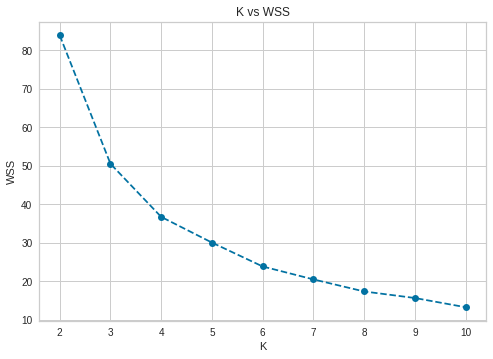

In [122]:
# Roots
wss = []
for k in clusters:
    # model definition
    kmeans = KMeans(init='random', n_clusters=k, n_init=10, max_iter=300, random_state=42)
    
    # model training
    kmeans.fit(df6)
    
    # validation
    wss.append(kmeans.inertia_)
    
# plot wss - elbow method
plt.plot(clusters, wss, linestyle='--', marker='o', color='b' )
plt.xlabel('K')
plt.ylabel('WSS')
plt.title('K vs WSS');

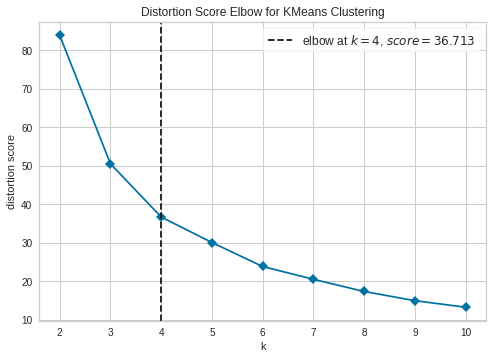

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [123]:
# Nuttela
kmeans = KElbowVisualizer( KMeans(), k=clusters, timings=False )
kmeans.fit(df6)
kmeans.show()

## 7.2 Sillhoute Score

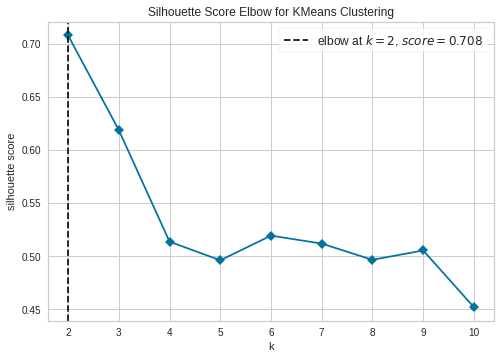

<AxesSubplot:title={'center':'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [124]:
# Nuttela
kmeans = KElbowVisualizer( KMeans(), k=clusters,metric='silhouette', timings=False )
kmeans.fit(df6)
kmeans.show()

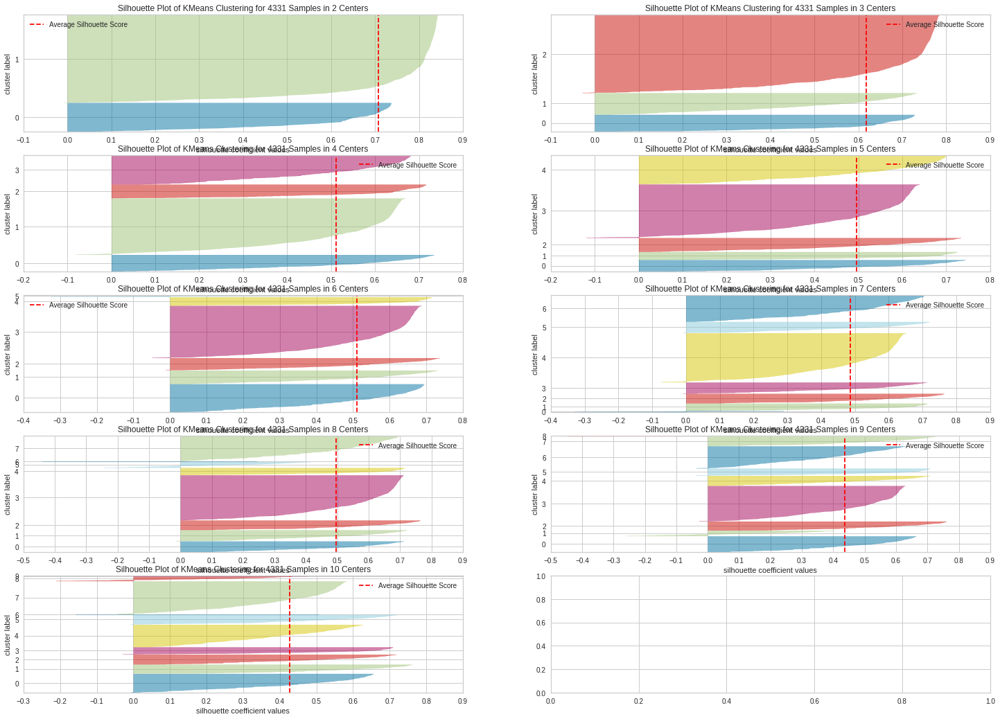

In [125]:
# Silhouette Analysis

fig, ax = plt.subplots(5,2, figsize=(25,18))
for k in clusters:
    km = KMeans(n_clusters=k, init='random', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(k,2)
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(df6)
    visualizer.finalize()

# 8.0 ModelTraining

## Kmeans

In [136]:
#model definition
k=3
kmeans = KMeans(init='random', n_clusters=k, n_init=10, max_iter=300, random_state=42)

#model training
kmeans.fit(df6)

#model clustering
labels = kmeans.labels_

## Cluster Validation

### wss (Within-cluster sum of squares)

In [137]:
print( f'WWS Value: {kmeans.inertia_}')

WWS Value: 50.5163008732105


### SS (Silhoute Score)

In [138]:
score = silhouette_score(df6, labels, metric='euclidean')
print(f'SS Value: {score}')

SS Value: 0.6186549006497123


# 9.0 Cluster Analysis

In [139]:
df9 = df5.copy()
df9['cluster'] = labels
df9.head()

,customer_id,gross_revenue,recency_days,invoice_no,avg_ticket,returns,cluster
0,0.926443,0.019301,0.997319,0.160976,0.000208,0.022222,0
1,0.117994,0.011567,0.150134,0.039024,0.000218,0.155556,2
2,0.039892,0.024009,0.005362,0.068293,0.000347,0.044444,2
3,0.235987,0.003384,0.254692,0.019512,0.000412,0.000000,1
4,0.463558,0.003125,0.892761,0.009756,0.003756,0.066667,0


## 9.1 - Visualization Inspection

### 9.1.1 - Silhouette

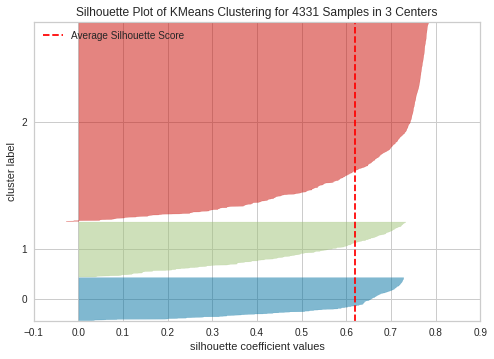

In [140]:
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(df6)
visualizer.finalize()

### 9.1.2 - 2d Plot

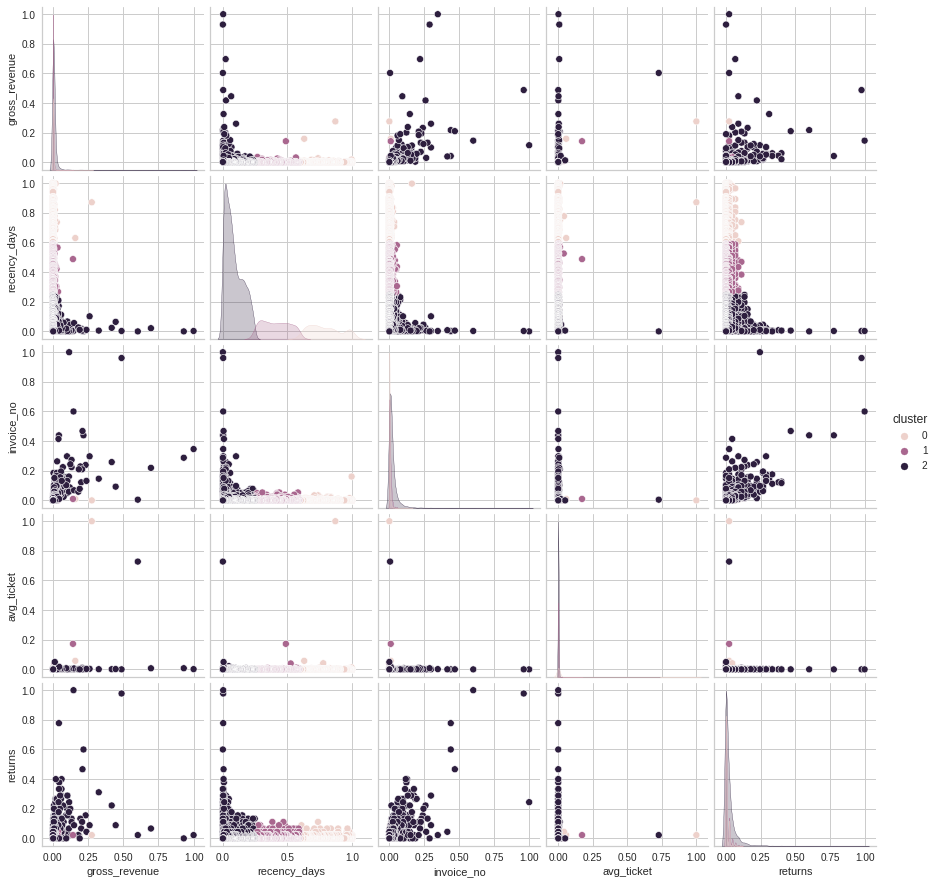

In [141]:
df_viz = df9.drop(columns = 'customer_id', axis=1)
sns.pairplot(df_viz, hue='cluster')

### 9.1.3 - UMAP

In [142]:
#!pip install umap-learn

<AxesSubplot:xlabel='embedding_x', ylabel='embedding_y'>

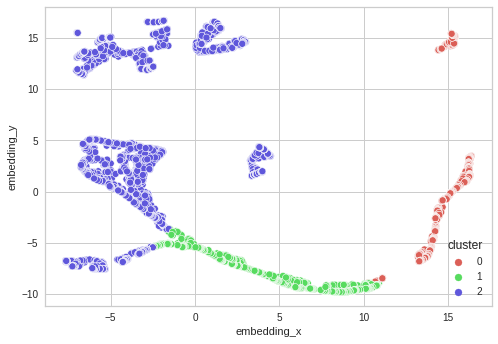

In [146]:
reducer = umap.UMAP(n_neighbors=50, random_state=42)
embedding = reducer.fit_transform(df6)

# embedding
df_viz['embedding_x'] = embedding[:,0]
df_viz['embedding_y'] = embedding[:,1]

# plot UMAP
sns.scatterplot(x = 'embedding_x', y='embedding_y', hue='cluster', palette=sns.color_palette('hls', n_colors=len(df_viz['cluster'].unique())  ), data=df_viz  )

In [144]:
# from plotly import express as px
# fig  = px.scatter_3d(df9, x='recency_days', y='invoice_no', z='gross_revenue', color='cluster')
# fig.show()

## Cluster Profile

In [145]:
# Number of customers
df_cluster = df9[['customer_id','cluster']].groupby('cluster').count().reset_index()
df_cluster['perc_customer'] = 100*(df_cluster['customer_id']/df_cluster['customer_id'].sum())

# Avg Gross revenue
df_avg_gross_revenue = df9[['gross_revenue','cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_gross_revenue, how='inner', on='cluster')

# Avg rececy days
df_avg_recency_days = df9[['recency_days','cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_recency_days, how='inner', on='cluster')

# Avg invoice_no
df_avg_invoice_no = df9[['invoice_no','cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_invoice_no, how='inner', on='cluster')

# Avg Ticket
df_ticket = df9[['avg_ticket', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_ticket, how='inner', on='cluster')

# Report
df_cluster

,cluster,customer_id,perc_customer,gross_revenue,recency_days,invoice_no,avg_ticket
0,0,628,14.500115,0.002157,0.788669,0.001693,0.002176
1,1,804,18.563842,0.002773,0.409924,0.005837,0.000673
2,2,2899,66.936042,0.009567,0.084738,0.021696,0.000617


**Cluster 01: (Candidatos a Insider)**

   - Número de customers: 6 (0,14% do customers)
   - Recência em média: 7 dias
   - Compras em média: 89 compras
   - Receita em média: $182.182,00 dólares
    
**Cluster 02:**

   - Números de customers: 31 (0,71% dos customers)
   - Recência em média: 14 dias
   - Compras em média: 53 compras
   - Receita em média: $40.543,52 dólares
   
**Cluster 03:**

   - Número de customers: 4.335 (99% do customers)
   - Recência em média: 92 dias
   - Compras em médias: 5 compras
   - Receita em média: $1.372,57 dólares

# 10.0 Deploy in production